<a href="https://colab.research.google.com/github/MarkoArsenovic/PPPO2021/blob/main/Vezbe02.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Vežbe 02** Poboljšanje fotografija

## Sadržaj



1.   Uvod
2.   Podudaranje histograma
3.   Detekcija ivica pomoću tehnika Canny, LOG / Zero-Crossing i Wavelets
4.   Otklanjanje šuma putem Autoenkodera
5.   Otklanjanje šuma pomoću analize glavnih komponenata (PCA), diskretne Fourier-ova transformacije (DFT) i diskretne talasne transformacije
6.   Mešanje gradijenta
7.   Pobošljanje kontrasta fotografije pomoću izjednačavanja histograma
8.   Otklanjanje šuma pomoću anizotropne difuzije



### Uvod

Cilj poboljšanja fotografije jeste poboljšati kvalitet fotografije ili učiniti da pojedine karakteristike izgledaju istaknutije. Tehnike koje se koriste su često tehnike opšte namene i ne pretpostavlja se snažan model procesa degradacije (za razliku od restauracije slike, što ćemo videti na nekim narednim vežbama). 

Neki primeri tehnika poboljšanja slike su uklanjanje šuma / zaglađivanje, poboljšanje kontrasta i izoštravanje.

Učitavanje dataseta potrebnog za ove vežbe
- učitati images.zip

In [ ]:
!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id=18kYa31GnHCxszZsM-D_hjurcFb7NKQ6s' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id=18kYa31GnHCxszZsM-D_hjurcFb7NKQ6s" -O images.zip && rm -rf /tmp/cookies.txt

--2021-03-08 15:19:18--  https://docs.google.com/uc?export=download&confirm=rVO_&id=18kYa31GnHCxszZsM-D_hjurcFb7NKQ6s
Resolving docs.google.com (docs.google.com)... 74.125.137.101, 74.125.137.100, 74.125.137.139, ...
Connecting to docs.google.com (docs.google.com)|74.125.137.101|:443... connected.
HTTP request sent, awaiting response... 302 Moved Temporarily
Location: https://doc-08-28-docs.googleusercontent.com/docs/securesc/8hg26q0q5k9e5gg98gu211mc0h5dg6m8/ls11k158v1jnaie6m017mg86vppc7hog/1615216725000/07050430151874469418/06766332326868470145Z/18kYa31GnHCxszZsM-D_hjurcFb7NKQ6s?e=download [following]
--2021-03-08 15:19:18--  https://doc-08-28-docs.googleusercontent.com/docs/securesc/8hg26q0q5k9e5gg98gu211mc0h5dg6m8/ls11k158v1jnaie6m017mg86vppc7hog/1615216725000/07050430151874469418/06766332326868470145Z/18kYa31GnHCxszZsM-D_hjurcFb7NKQ6s?e=download
Resolving doc-08-28-docs.googleusercontent.com (doc-08-28-docs.googleusercontent.com)... 74.125.137.132, 2607:f8b0:4023:c03::84
Connecting

Unzip dataseta

In [ ]:
!unzip images.zip

Archive:  images.zip
   creating: images/
  inflating: images/apollo.png       
  inflating: images/apollo_part_000.png  
  inflating: images/apollo_part_001.png  
  inflating: images/apollo_part_002.png  
  inflating: images/apollo_part_003.png  
  inflating: images/autoencoder_10.png  
  inflating: images/autoencoder_100.png  
  inflating: images/autoencoder_20.png  
  inflating: images/autoencoder_20_1.png  
  inflating: images/autoencoder_30.png  
  inflating: images/autoencoder_40.png  
  inflating: images/autoencoder_50.png  
  inflating: images/autoencoder_60.png  
  inflating: images/autoencoder_70.png  
  inflating: images/autoencoder_80.png  
  inflating: images/autoencoder_90.png  
  inflating: images/beach.png        
  inflating: images/bird.png         
  inflating: images/bird2.png        
  inflating: images/blend_interm.png  
  inflating: images/cameraman.png    
  inflating: images/cameraman_denoise_aniso_diff.png  
  inflating: images/canny_out.png    
  inflating: i

### Histogram Matching  // Podudaranje histograma

Histogram predstavlja grafički prikaz podataka. 

Histogram fotografije je vrsta histograma koji deluje kao grafički prikaz tonske raspodele digitalne fotografije. Ucrtava se broj piksela za svaku tonsku vrednost. Gledajući histogram za određenu fotografiju, gledalac će na prvi pogled moći da proceni celokupnu distribuciju tonova.

Histogrami fotografija prisutni su na mnogim modernim digitalnim fotoaparatima. Fotografi ih mogu koristiti kao pomoć pri prikazivanju raspodele uhvaćenih tonova, kao i da li su detalji slike izgubljeni izduvanim svetlima ili zatamnjenim senkama.

Horizontalna osa grafikona predstavlja varijacije tona, dok vertikalna osa predstavlja ukupan broj piksela u određenom tonu.






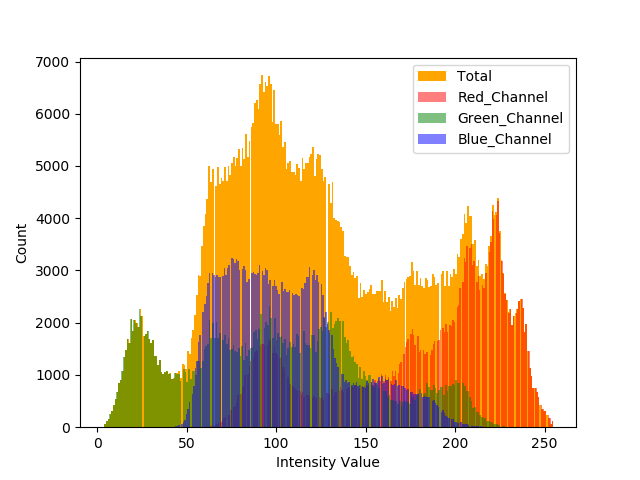

Podudaranje histograma je zadatak obrade fotografija gde se fotografija menja na takav način da se njen histogram podudara sa histogramom histograma druge referentne (šablonske) fotografije. 

Algoritam je opisan na sledeći način:
1. Izračunajte kumulativni histogram za svaku fotografiju.
2. Za bilo koju datu vrednost piksela xi, na ulaznoj fotografiji, pronađite 
odgovarajuću vrednost piksela xj, na izlaznoj fotografiji poklapanjem histograma ulazne fotografijesa histogramom šablona fotografije G (xi) = H (xj), kao što je prikazano na sledećem dijagramu.
3. Zamenite piksel xi na ulazu sa xj kao što je prikazano na sledećem dijagramu.

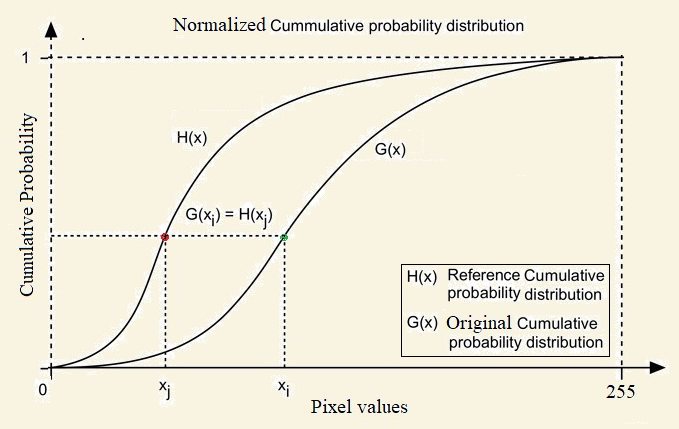

255 255


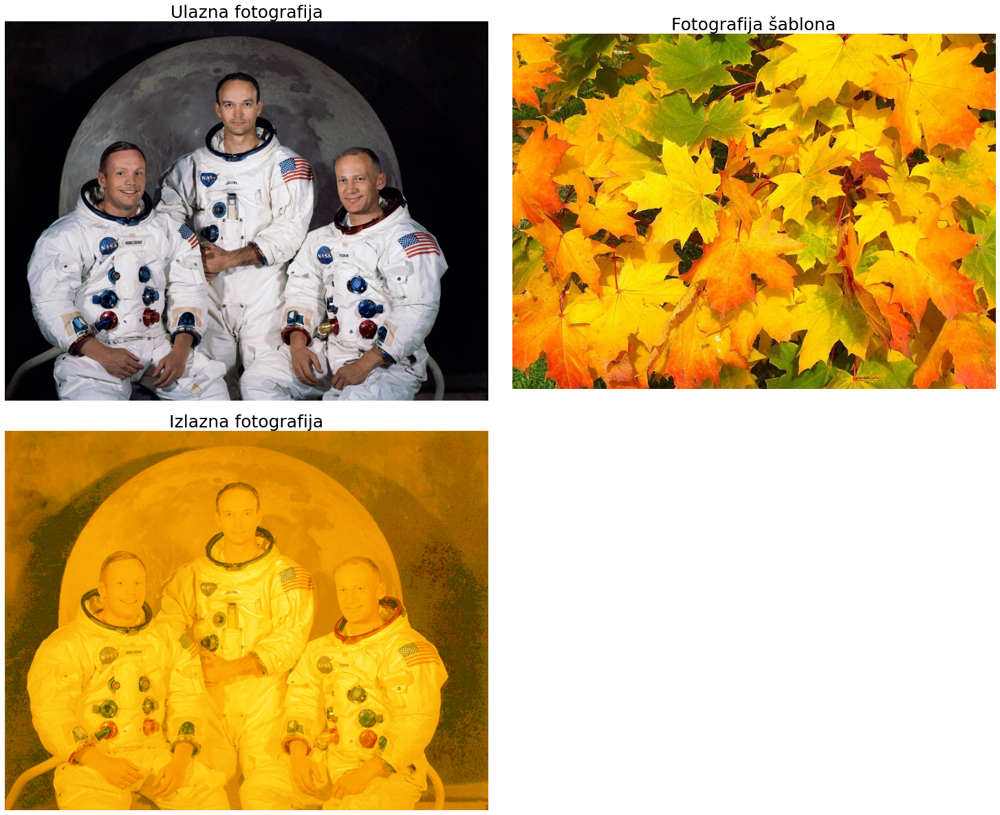

In [ ]:
# Učitavanje potrebnih bilblioteka
%matplotlib inline
from skimage.exposure import cumulative_distribution
from skimage.io import imread
from skimage.color import rgb2gray
import matplotlib.pylab as plt
import numpy as np

# 1.
"""
Primenimo algoritam za podudaranje histograma (histogram-matching) 
sa funkcijom hist_matching(), koja prihvata original i obrazac fotografije
cdf zajedno sa originalnom fotografijom  
"""
def hist_matching(c, c_t, im):
    b = np.interp(c, c_t, np.arange(256))   # find closest matches to b_t
    pix_repl = {i:b[i] for i in range(256)} # dictionary to replace the pixels
    mp = np.arange(0,256)
    for (k, v) in pix_repl.items():
        mp[k] = v
    s = im.shape
    im = np.reshape(mp[im.ravel()], im.shape)
    im = np.reshape(im, s)
    return im

# 2. Izračunajte cdf(cumulative distribution function) fotografije sa sledećom funkcijom:
# Napomena: CDF kvantifikuje verovatnoću posmatranja određenih intenziteta piksela.
def cdf(im):
    c, b = cumulative_distribution(im)
    #print(b)
    for i in range(b[0]):
        c = np.insert(c, 0, 0)
    for i in range(b[-1]+1, 256):
        c = np.append(c, 1)
    return c

# 3.
"""
Na kraju, učitajte ulaznu fotografiju i fotografiju šablona, izračunajte njihove cdf-ove i kreirajte
izlaznu fotografiju sa funkcijom hist_matching(). 
Prikažite ulaznu, šablon i izlaznu fotografiju izvršavanjem sledećeg koda:
"""
im = imread('images/apollo.png').astype(np.uint8)
im_t = imread('images/leaves.png')
print(np.max(im), np.max(im_t))

im1 = np.zeros(im.shape).astype(np.uint8)
for i in range(3):
    c = cdf(im[...,i])
    c_t = cdf(im_t[...,i])
    im1[...,i] = hist_matching(c, c_t, im[...,i])

plt.figure(figsize=(20,17))
plt.subplots_adjust(left=0, top=0.95, right=1, bottom=0, wspace=0.05, hspace=0.05)
plt.subplot(221), plt.imshow(im), plt.axis('off'), plt.title('Ulazna fotografija', size=25)
plt.subplot(222), plt.imshow(im_t), plt.axis('off'), plt.title('Fotografija šablona', size=25)
plt.subplot(223), plt.imshow(im1[...,:3]), plt.axis('off'), plt.title('Izlazna fotografija', size=25)
plt.show()

### Edge Detection with Canny, LOG / Zero-Crossing and Wavelets // Detekcija ivica

Detekcija ivica je tehnika pred-obrade gde je ulaz obično dvodimenzionalna grayscale fotografija, a izlaz je skup krivih (ivica). Pikseli koji grade ivice na fotografiji su oni kod kojih dolazi do naglih brzih promena (diskontinuiteta) u funkciji intenziteta fotografije, a cilj otkrivanja ivica je identifikacija ovih promena. Ivice se tipično otkrivaju pronalaženjem lokalnih ekstrema prvog derivata (gradijent) ili pronalaženjem ukrštanja nula drugog derivata (Laplacian-a) fotografije. 
Prvo ćemo primeniti dve veoma popularne detekcije ivica tehnike, Canny i Marr-Hildreth (LoG sa Zero Crossing). Zatim ćemo primeniti otkrivanje ivica zasnovanih na talasima.

Za Canny tehniku koristićemo implementaciju SimpleITK-a detektora za fotografije koje su skalarno vrednovane (na primer grayscale fotografije). Ova implementacija koristi drugi pravac izvoda i nula ukrštanja za pronalaženje ivica. Niža vrednost σ za Gausovu zamućenost daje detaljnije ivice, dok veća vrednost generiše istaknutije ivice.

Za Marr-Hildrethov algoritam, potrebno je da izračunamo preseke nula na fotografiji konvolvirane u Laplacian of Gaussian (LoG). Ivični pikseli se mogu identifikovati tretiranjem LoGsmoothed fotografije kao binarne fotografije, a zatim određivanjem znaka piksela.

Instalacija SimpleITK modula

In [ ]:
!pip install SimpleITK

     |████████████████████████████████| 47.4MB 92kB/s 


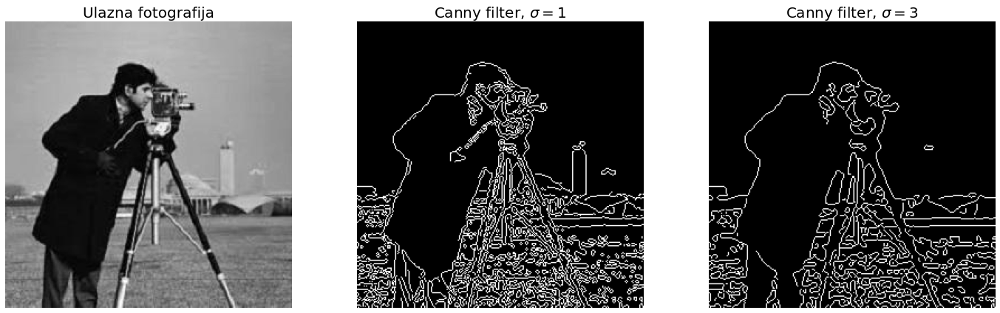

In [ ]:
# Učitavanje potrebnih bilblioteka
import matplotlib.pyplot as plt
import SimpleITK as sitk

# 1. Pročitajte ulaznu fotografiju sivih nijansi (grayscale) i pretvorite je u tip podataka float64:
image = sitk.ReadImage('images/cameraman.png',sitk.sitkInt8) # 8-bit cameraman grayscale image
image = sitk.Cast(image, sitk.sitkFloat64)

# 2.
"""
Izračunajte Canny filter za dve vrednosti sa Gauss-ovog zamućenja (1 i 3) sa
istim pragovima histereze (kašnjenja, zaostajanja):
"""
edges1 = sitk.CannyEdgeDetection(image, lowerThreshold=5, upperThreshold=10, variance=[1, 1])
edges2 = sitk.CannyEdgeDetection(image, lowerThreshold=5, upperThreshold=10, variance=[3, 3])

# 3.
"""
Pretvorite izlaz u NumPy niz za prikaz
"""
image = sitk.GetArrayFromImage(image)
edges1 = sitk.GetArrayFromImage(edges1)
edges2 = sitk.GetArrayFromImage(edges2)

# 4. Prikažite ulaznu fotografiju i fotografije ivica:
fig = plt.figure(figsize=(20, 6))

plt.subplot(131), plt.imshow(image.astype(np.uint8), cmap=plt.cm.gray), plt.axis('off'), plt.title('Ulazna fotografija', fontsize=20)
plt.subplot(132), plt.imshow(edges1, cmap=plt.cm.gray), plt.axis('off'), plt.title('Canny filter, $\sigma=1$', fontsize=20)
plt.subplot(133), plt.imshow(edges2, cmap=plt.cm.gray), plt.axis('off'), plt.title('Canny filter, $\sigma=3$', fontsize=20)

fig.tight_layout()

plt.show()

1.0


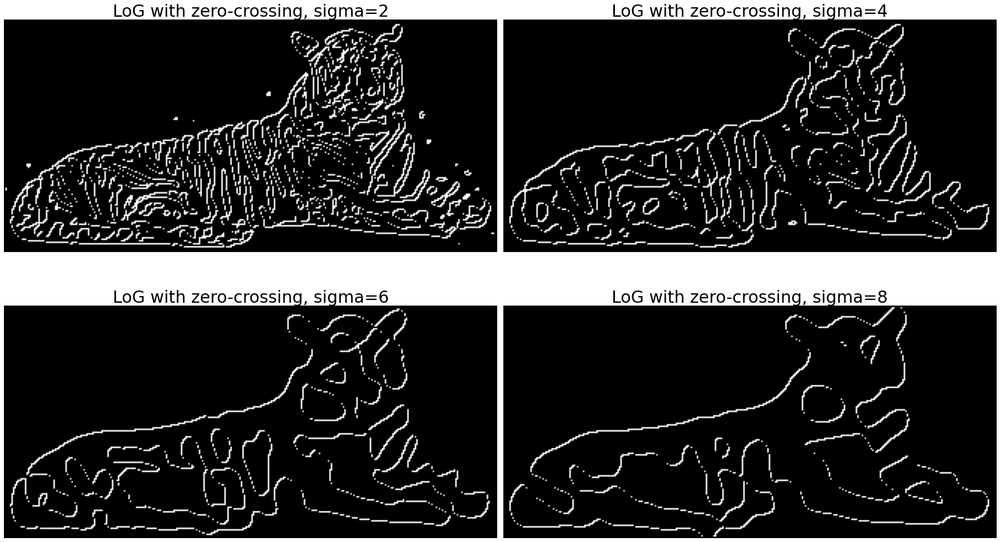

In [ ]:
import numpy as np
from scipy import ndimage, misc
import matplotlib.pyplot as plt
import imageio
from skimage.color import rgb2gray

# 1.
"""
Prvo, definišemo funkciju any_neighbor_zero() 
koja uzima piksel u fotografiji kao ulaz i 
vraća True ako je bilo koji (8 povezanih) susednih piksela nula:
"""
def any_neighbor_zero(img, i, j):
    for k in range(-1,2):
      for l in range(-1,2):
         if img[i+k, j+k] == 0:
            return True
    return False

# 2.
"""
Definišemo funkciju zero_crossing():
"""
def zero_crossing(img):
  img[img > 0] = 1
  img[img < 0] = 0
  out_img = np.zeros(img.shape)
  for i in range(1,img.shape[0]-1):
    for j in range(1,img.shape[1]-1):
      if img[i,j] > 0 and any_neighbor_zero(img, i, j):
        out_img[i,j] = 255
  return out_img

# 3.
"""
Na kraju, pozovite funkciju zero_crossing() 
na ulaznoj fotografiji nad kojom je izvrsen LoG.
Prikažite izlaz:
LoG - Laplacian of Gaussian
"""
img = rgb2gray(imageio.imread('images/tiger.png'))

print(np.max(img))
fig = plt.figure(figsize=(25,15))
plt.gray() # show the filtered result in grayscale
for sigma in range(2,10, 2):
    plt.subplot(2,2,sigma/2)
    result = ndimage.gaussian_laplace(img, sigma=sigma)
    result = zero_crossing(result)
    plt.imshow(result)
    plt.axis('off')
    plt.title('LoG with zero-crossing, sigma=' + str(sigma), size=30)

plt.tight_layout()
plt.show()

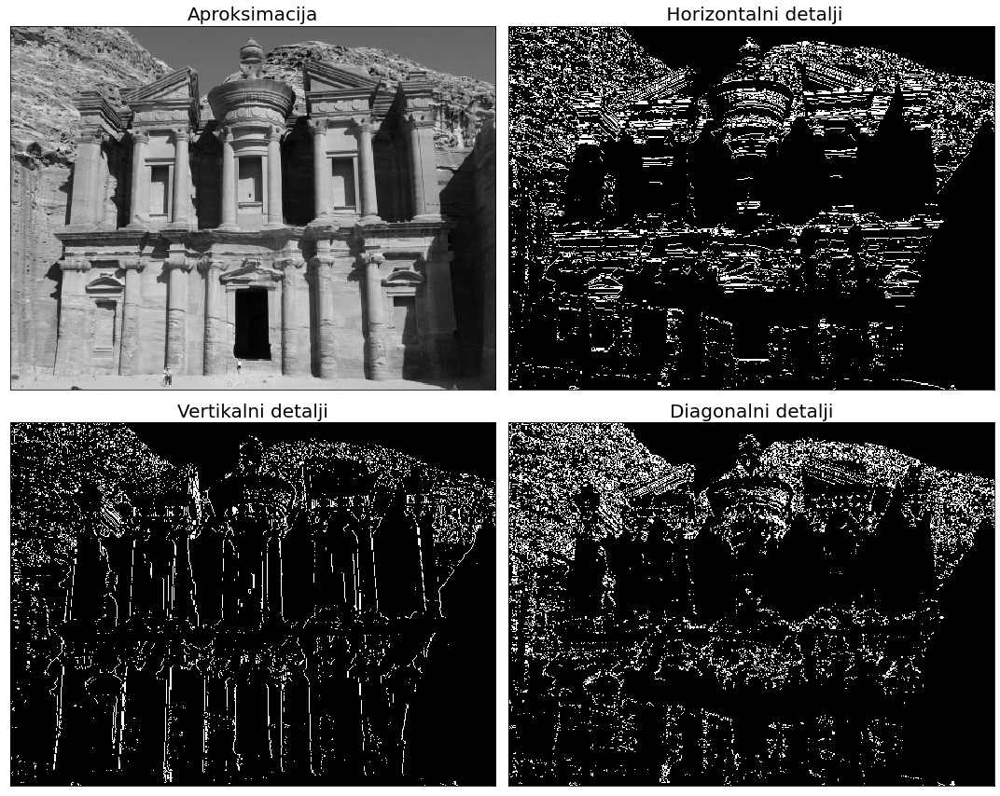

In [ ]:
#% matplotlib inline
import pywt
from skimage.io import imread
from skimage.color import rgb2gray
from skimage.filters import threshold_otsu
import matplotlib.pylab as plt
# 1. Učitajte ulaznu fotografiju i pretvorite je u grayscale (fotografiju sivih tonova):
original = rgb2gray(imread('images/ed-deir.png'))

# 2.
"""
Primenite 2D-DWT na fotografiju pomoću haar talasa na grayscale fotografiji. 
Ovo će vratiti talasne koeficijente:
"""
coeffs2 = pywt.dwt2(original, 'haar')

# 3. 
"""
Izdvojite približnu fotografiju zajedno sa:
horizontalnom, vertikalnom i dijagonalnim detaljima (ivice), koristeći sledeći kod:
"""
titles = ['Aproksimacija', ' Horizontalni detalji', 'Vertikalni detalji', 'Diagonalni detalji']
LL, (LH, HL, HH) = coeffs2

# 4. Prikažite rezultujuće fotografije
fig = plt.figure(figsize=(15, 12))
for i, a in enumerate([LL, LH, HL, HH]):
    ax = fig.add_subplot(2, 2, i + 1)
    a = abs(a)
    #a = np.clip(a, 0, 1)
    if i > 0:
        th = threshold_otsu(a)
        a[a > th] = 1
        a[a <= th] = 0
    ax.imshow(a, interpolation="nearest", cmap=plt.cm.gray)
    ax.set_title(titles[i], fontsize=20)
    ax.set_xticks([])
    ax.set_yticks([])
fig.tight_layout()
plt.show()

### Image Denoising with Denoising Autoencoder // Otklanjanje šuma putem Autoenkodera



Autoenkoder je neuronska mreža koja se često koristi za učenje efikasnog predstavljanja ulaznih podataka (obično u smanjenoj dimenziji) na nenadgledan način. Autoenkoder za izoštravanje je stohastička verzija autokodera koji uzima (slične) ulaze oštećene šumom i obučen je za oporavak originalnih ulaza (obično koristeći neke funkcije biblioteke dubokog učenja) kako bi dobio dobru predstavu. Pomoću autodekodera za izoštravanje možemo naučiti robusne prikaze iz niza sličnih ulaznih fotografija (oštećenih šumom), a zatim generisati fotografije sa otklonjenim šumom.

Sledeći dijagram prikazuje strukturu mreže i kako autoenkoder radi sa nizom podataka fotografija lica:

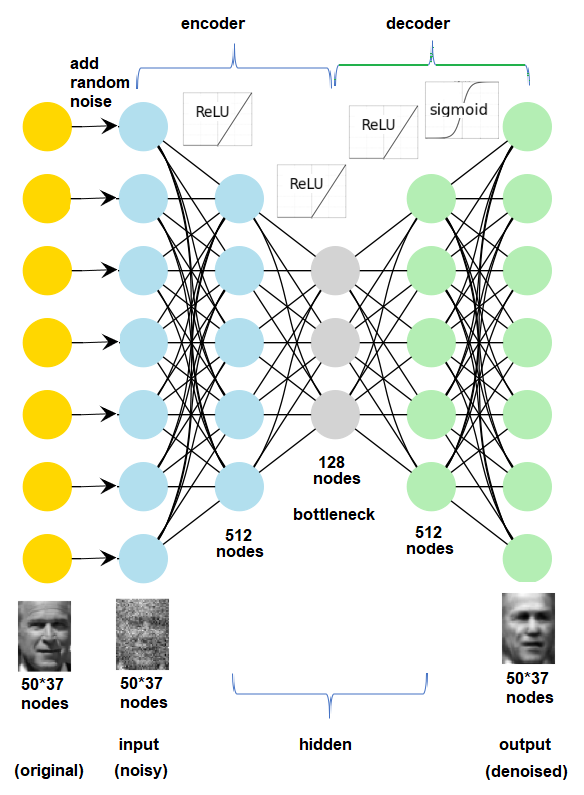

Instalacija torchvision modula

In [ ]:
!pip3 install torchvision

In [ ]:
import torchvision as torch, matplotlib, sklearn, numpy as np
print(np.__version__, torch.__version__, matplotlib.__version__, sklearn.__version__) #torchvision.__version__, 

1.19.5 0.8.2+cu101 3.2.2 0.22.2.post1


Instalacija modula torchviz

In [ ]:
!pip3 install torchviz

     |████████████████████████████████| 51kB 5.8MB/s 
  Created wheel for torchviz: filename=torchviz-0.0.1-cp37-none-any.whl size=3520 sha256=24285efc88b9d56e6d895455fe3ce715d15964df8a992b36ada21f563277c574
  Stored in directory: /root/.cache/pip/wheels/2a/c2/c5/b8b4d0f7992c735f6db5bfa3c5f354cf36502037ca2b585667
Successfully built torchviz


(1288, 50, 37)
epoch [1/100], loss:0.6591, MSE_loss:0.0193
epoch [2/100], loss:0.6561, MSE_loss:0.0123
epoch [3/100], loss:0.6540, MSE_loss:0.0162
epoch [4/100], loss:0.6569, MSE_loss:0.0151
epoch [5/100], loss:0.6581, MSE_loss:0.0120
epoch [6/100], loss:0.6587, MSE_loss:0.0136
epoch [7/100], loss:0.6631, MSE_loss:0.0095
epoch [8/100], loss:0.6432, MSE_loss:0.0115
epoch [9/100], loss:0.6535, MSE_loss:0.0121
epoch [10/100], loss:0.6535, MSE_loss:0.0072


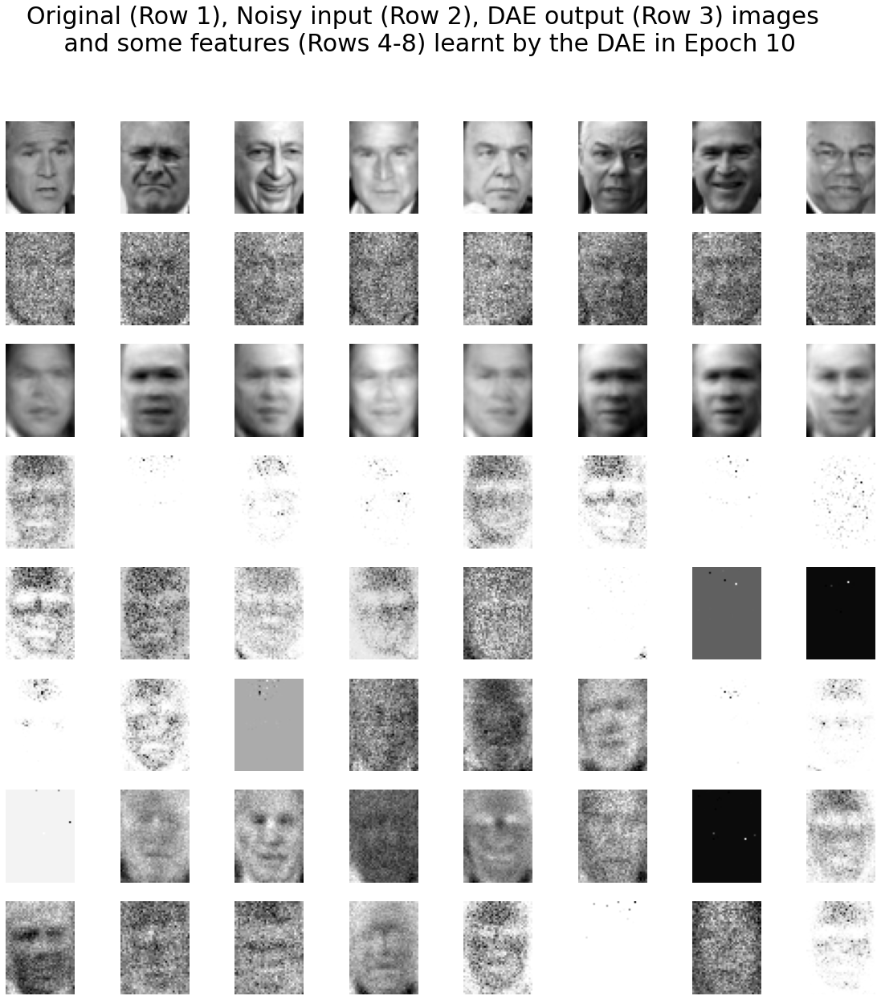

epoch [11/100], loss:0.6492, MSE_loss:0.0083
epoch [12/100], loss:0.6425, MSE_loss:0.0078
epoch [13/100], loss:0.6606, MSE_loss:0.0071
epoch [14/100], loss:0.6435, MSE_loss:0.0091
epoch [15/100], loss:0.6452, MSE_loss:0.0088
epoch [16/100], loss:0.6451, MSE_loss:0.0069
epoch [17/100], loss:0.6406, MSE_loss:0.0095
epoch [18/100], loss:0.6469, MSE_loss:0.0075
epoch [19/100], loss:0.6487, MSE_loss:0.0095
epoch [20/100], loss:0.6449, MSE_loss:0.0083


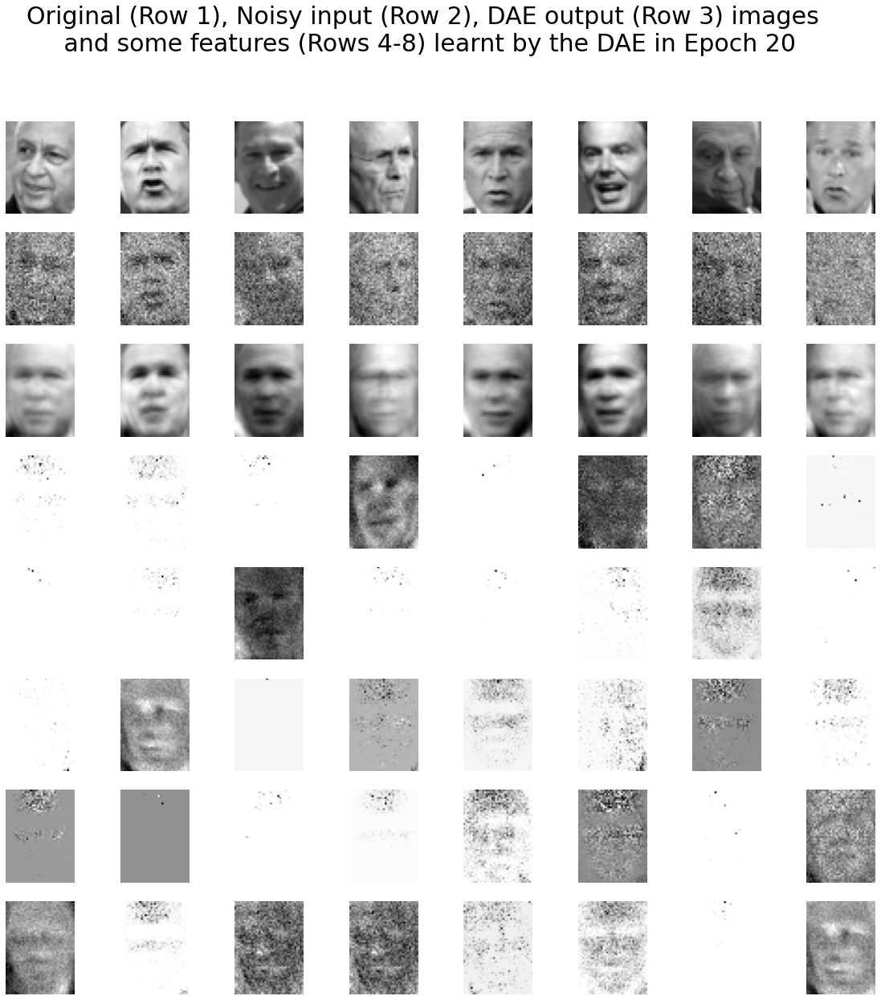

epoch [21/100], loss:0.6577, MSE_loss:0.0070
epoch [22/100], loss:0.6410, MSE_loss:0.0084
epoch [23/100], loss:0.6553, MSE_loss:0.0106
epoch [24/100], loss:0.6427, MSE_loss:0.0091
epoch [25/100], loss:0.6452, MSE_loss:0.0072
epoch [26/100], loss:0.6548, MSE_loss:0.0068
epoch [27/100], loss:0.6437, MSE_loss:0.0061
epoch [28/100], loss:0.6251, MSE_loss:0.0083
epoch [29/100], loss:0.6529, MSE_loss:0.0057
epoch [30/100], loss:0.6472, MSE_loss:0.0055


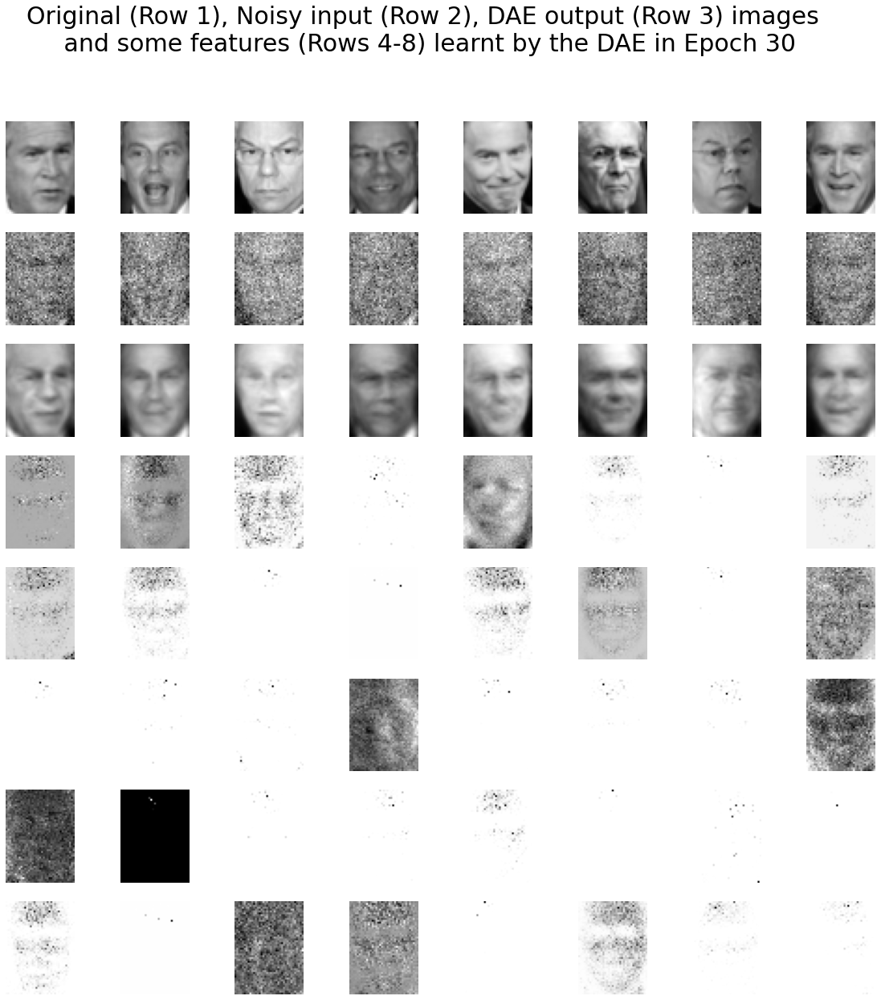

epoch [31/100], loss:0.6473, MSE_loss:0.0055
epoch [32/100], loss:0.6539, MSE_loss:0.0083
epoch [33/100], loss:0.6401, MSE_loss:0.0069
epoch [34/100], loss:0.6422, MSE_loss:0.0065
epoch [35/100], loss:0.6535, MSE_loss:0.0053
epoch [36/100], loss:0.6426, MSE_loss:0.0092
epoch [37/100], loss:0.6419, MSE_loss:0.0059
epoch [38/100], loss:0.6470, MSE_loss:0.0055
epoch [39/100], loss:0.6333, MSE_loss:0.0063
epoch [40/100], loss:0.6454, MSE_loss:0.0074


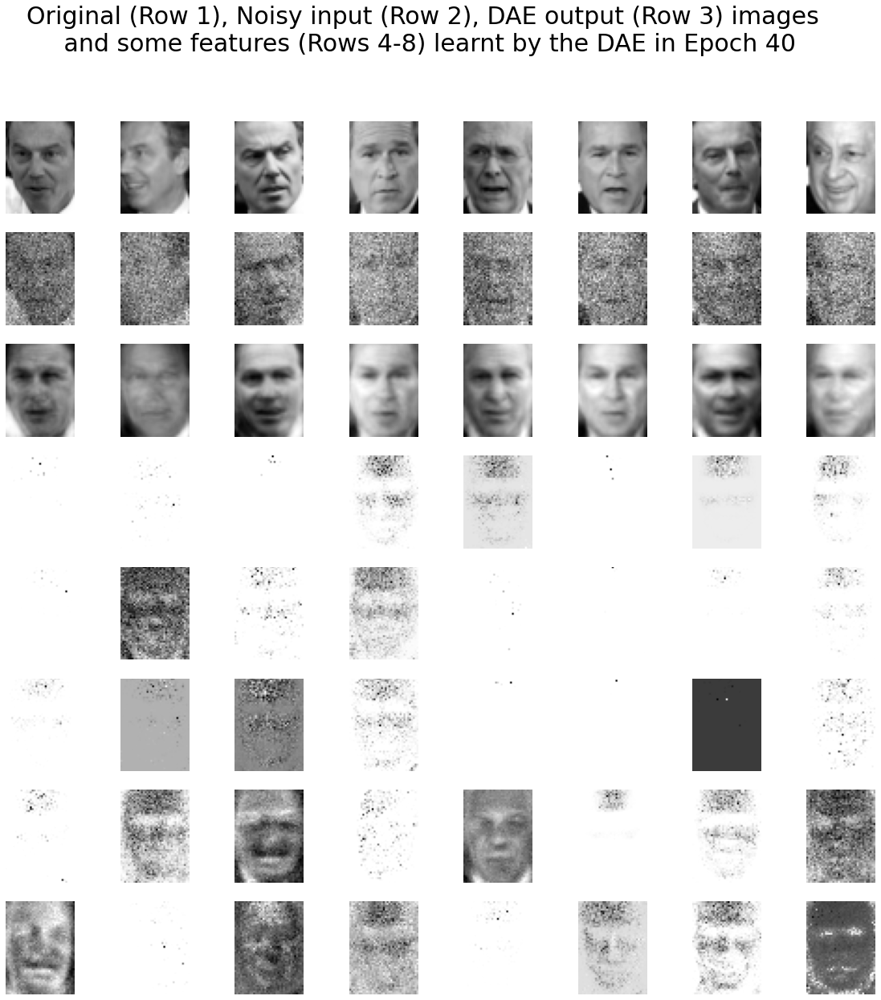

epoch [41/100], loss:0.6312, MSE_loss:0.0078
epoch [42/100], loss:0.6408, MSE_loss:0.0066
epoch [43/100], loss:0.6337, MSE_loss:0.0070
epoch [44/100], loss:0.6405, MSE_loss:0.0064
epoch [45/100], loss:0.6267, MSE_loss:0.0071
epoch [46/100], loss:0.6428, MSE_loss:0.0061
epoch [47/100], loss:0.6306, MSE_loss:0.0062
epoch [48/100], loss:0.6416, MSE_loss:0.0075
epoch [49/100], loss:0.6551, MSE_loss:0.0085
epoch [50/100], loss:0.6400, MSE_loss:0.0067


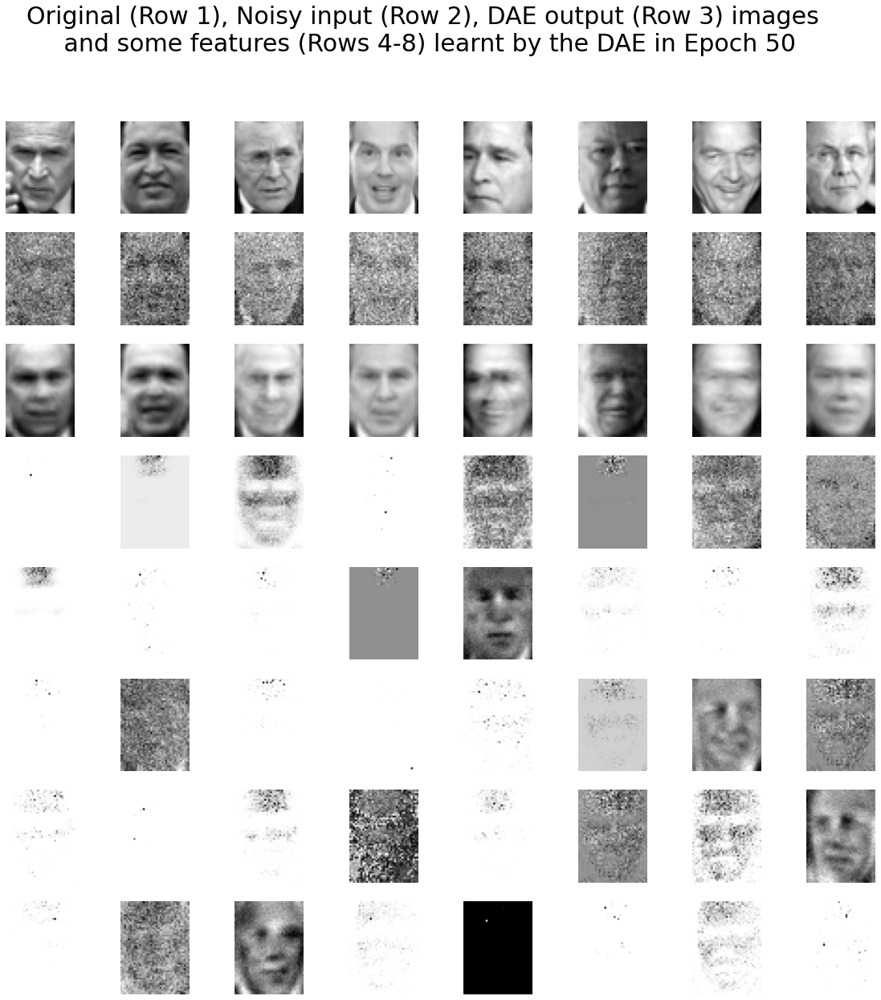

epoch [51/100], loss:0.6457, MSE_loss:0.0071
epoch [52/100], loss:0.6401, MSE_loss:0.0071
epoch [53/100], loss:0.6537, MSE_loss:0.0056
epoch [54/100], loss:0.6494, MSE_loss:0.0051
epoch [55/100], loss:0.6406, MSE_loss:0.0058
epoch [56/100], loss:0.6354, MSE_loss:0.0065
epoch [57/100], loss:0.6526, MSE_loss:0.0065
epoch [58/100], loss:0.6494, MSE_loss:0.0061
epoch [59/100], loss:0.6341, MSE_loss:0.0070
epoch [60/100], loss:0.6400, MSE_loss:0.0064


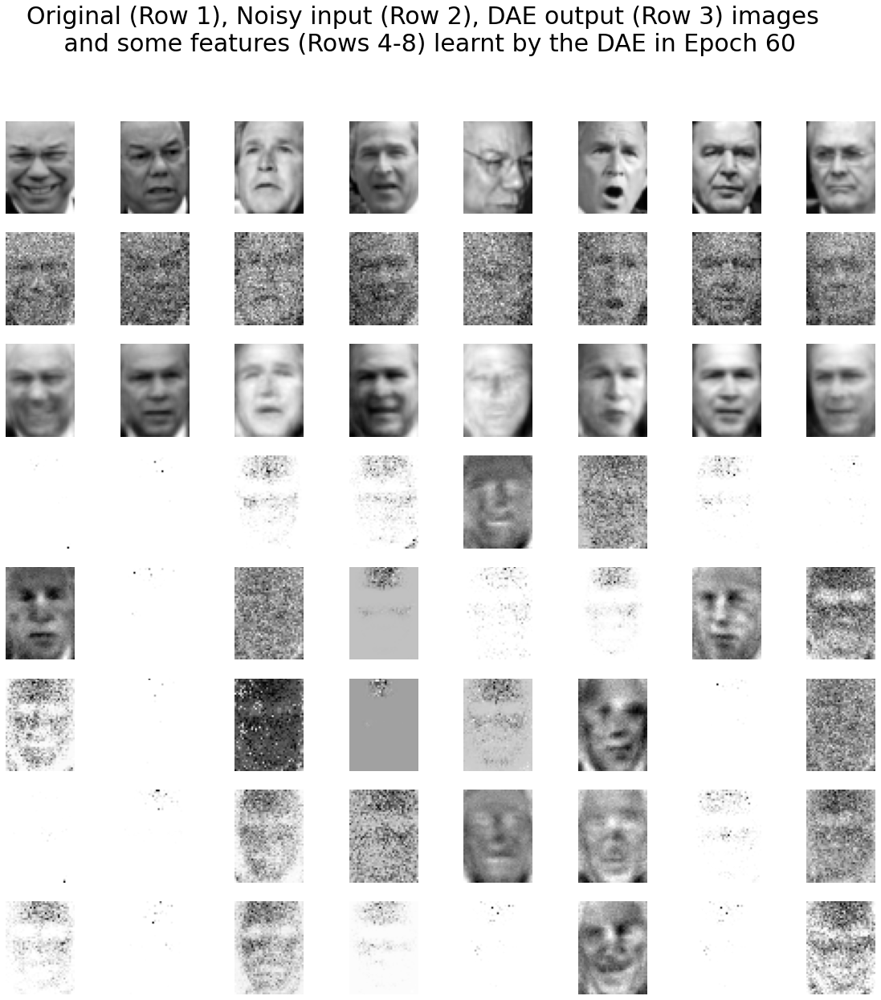

epoch [61/100], loss:0.6468, MSE_loss:0.0069
epoch [62/100], loss:0.6323, MSE_loss:0.0064
epoch [63/100], loss:0.6387, MSE_loss:0.0087
epoch [64/100], loss:0.6433, MSE_loss:0.0052
epoch [65/100], loss:0.6515, MSE_loss:0.0061
epoch [66/100], loss:0.6459, MSE_loss:0.0062
epoch [67/100], loss:0.6472, MSE_loss:0.0063
epoch [68/100], loss:0.6480, MSE_loss:0.0046
epoch [69/100], loss:0.6385, MSE_loss:0.0061
epoch [70/100], loss:0.6244, MSE_loss:0.0063


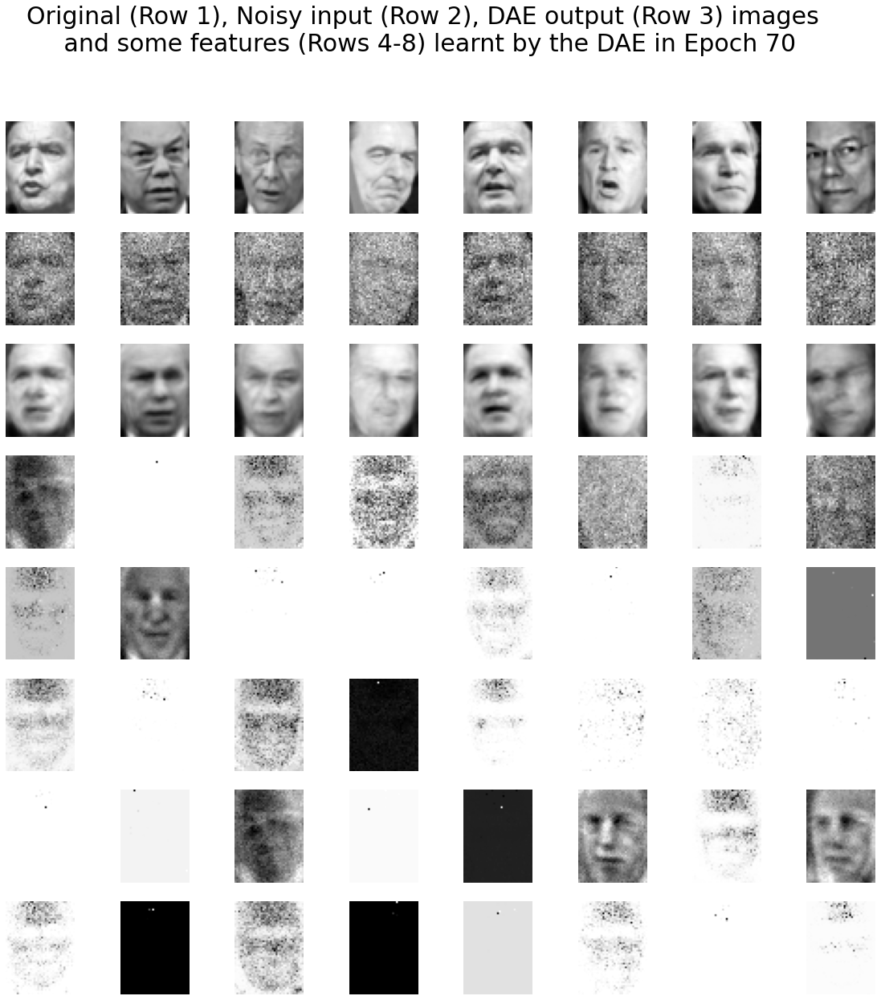

epoch [71/100], loss:0.6512, MSE_loss:0.0053
epoch [72/100], loss:0.6380, MSE_loss:0.0058
epoch [73/100], loss:0.6511, MSE_loss:0.0048
epoch [74/100], loss:0.6449, MSE_loss:0.0080
epoch [75/100], loss:0.6508, MSE_loss:0.0059
epoch [76/100], loss:0.6396, MSE_loss:0.0048
epoch [77/100], loss:0.6415, MSE_loss:0.0044
epoch [78/100], loss:0.6505, MSE_loss:0.0049
epoch [79/100], loss:0.6571, MSE_loss:0.0053
epoch [80/100], loss:0.6478, MSE_loss:0.0051


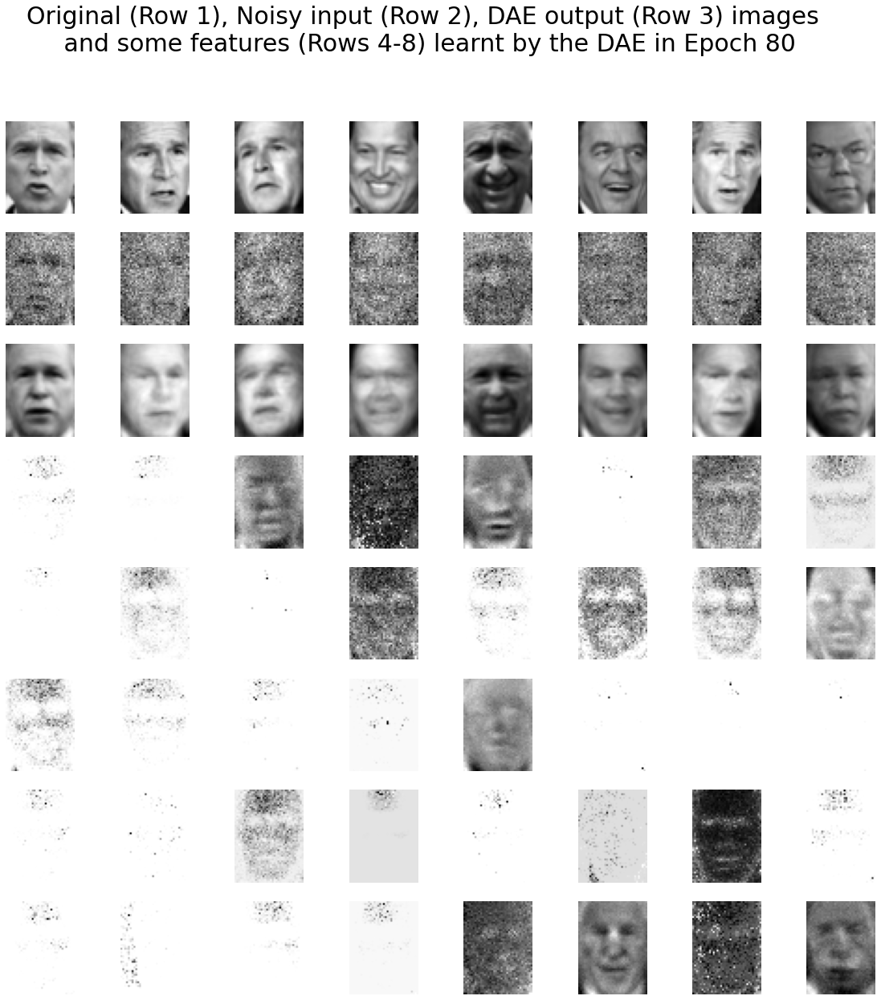

epoch [81/100], loss:0.6584, MSE_loss:0.0054
epoch [82/100], loss:0.6490, MSE_loss:0.0050
epoch [83/100], loss:0.6441, MSE_loss:0.0069
epoch [84/100], loss:0.6514, MSE_loss:0.0047
epoch [85/100], loss:0.6443, MSE_loss:0.0067
epoch [86/100], loss:0.6460, MSE_loss:0.0045
epoch [87/100], loss:0.6421, MSE_loss:0.0060
epoch [88/100], loss:0.6403, MSE_loss:0.0062
epoch [89/100], loss:0.6561, MSE_loss:0.0057
epoch [90/100], loss:0.6420, MSE_loss:0.0055


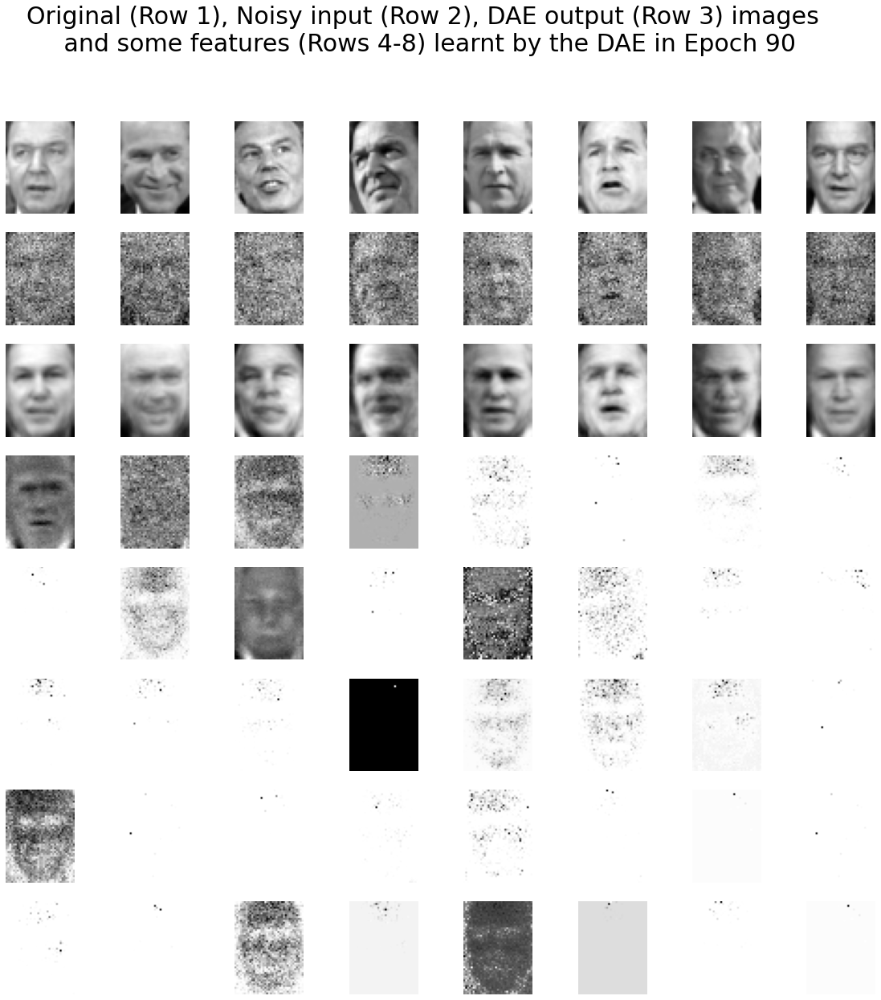

epoch [91/100], loss:0.6420, MSE_loss:0.0047
epoch [92/100], loss:0.6231, MSE_loss:0.0060
epoch [93/100], loss:0.6184, MSE_loss:0.0064
epoch [94/100], loss:0.6347, MSE_loss:0.0056
epoch [95/100], loss:0.6384, MSE_loss:0.0052
epoch [96/100], loss:0.6319, MSE_loss:0.0073
epoch [97/100], loss:0.6353, MSE_loss:0.0066
epoch [98/100], loss:0.6312, MSE_loss:0.0061
epoch [99/100], loss:0.6381, MSE_loss:0.0049
epoch [100/100], loss:0.6443, MSE_loss:0.0055


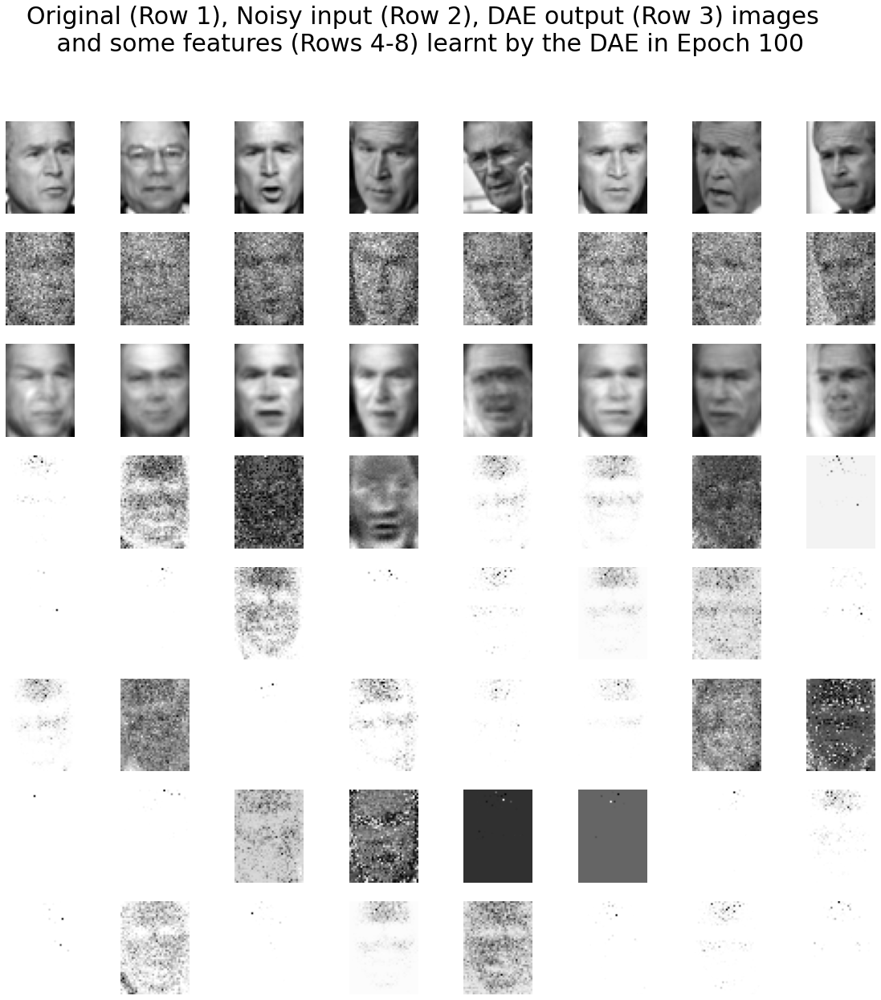

In [ ]:
import os
import numpy as np
import matplotlib.pylab as plt
#! pip install torchviz
import torch
from torch import nn
from torch.autograd import Variable
from torch.utils.data import DataLoader
from torchvision import transforms
from torchvision.utils import save_image
from torchviz import make_dot

from sklearn.datasets import fetch_lfw_people

#print(torch.cuda.current_device())
#print(torch.cuda.device(0))
#print(torch.cuda.device_count())
#print(torch.cuda.get_device_name(0))

# 1.
"""
Definišite funkcije to_img() i plot_sample_img() za konverziju PyTorch tenzor 
na fotografiju iz skupa podataka lfw  (svaka fotografija u sivim tonovima ima veličinu 50 x 37)
Svaku fotografiju sačuvati:

Tenzor (lat.), u matematici predstavlja veličinu koja je, 
u poređenju sa skalarnim i vektorskim veličinama, mnogo složenije strukture
"""
def to_img(x):
    x = x.view(x.size(0), 1, 50, 37)
    return x

def plot_sample_img(img, name):
    img = img.view(1, 50, 37)
    save_image(img, './sample_{}.png'.format(name))

# 2.
"""
Definišite funkciju add_noise() da biste na fotografiju dodali slučajni Gauss-ov šum:
"""
def add_noise(img):
    noise = torch.randn(img.size()) * 0.2
    noisy_img = img + noise
    return noisy_img

# 3.
"""
Implementirajte min_max_normalization() i tensor_round()
funkcije pretprocesiranja za normalizaciju, odnosno zaokruživanje tenzora. 
Takođe, kreirajte kanal transformacije sa definisanim funkcijama:
"""
def min_max_normalization(tensor, min_value, max_value):
    min_tensor = tensor.min()
    tensor = (tensor - min_tensor)
    max_tensor = tensor.max()
    tensor = tensor / max_tensor
    tensor = tensor * (max_value - min_value) + min_value
    return tensor


def tensor_round(tensor):
    return torch.round(tensor)

img_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Lambda(lambda tensor:min_max_normalization(tensor, 0, 1)),
    transforms.Lambda(lambda tensor:tensor_round(tensor))
])

# 4. 
"""
Preuzmite lfw skup podataka i kreirajte uređaj za učitavanje podataka veličine paketa 8:
"""

batch_size = 8 # 16
dataset = fetch_lfw_people(min_faces_per_person=70, resize=0.4).images / 255
print(dataset.shape)
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

# 5.
"""
Implementirajte klasu autoencoder, članove kodera i dekodera i
metoda klase forward():
"""
class autoencoder(nn.Module):
    def __init__(self):
        super(autoencoder, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(50 * 37, 512),
            nn.ReLU(True),
            nn.Linear(512, 128),
            nn.ReLU(True))
        self.decoder = nn.Sequential(
            nn.Linear(128, 512),
            nn.ReLU(True),
            nn.Linear(512, 50 * 37),
            nn.Sigmoid())

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x

# 6.
"""
Instancirajte klasu autoencoder, a zatim definišite funkciju gubitka kao binarnu
cross-entropy (BCE) funkciju gubitka i optimizator kao Adam optimizator koji koristi
sledeći fragment koda:
"""

learning_rate = 1e-3
cuda = False #True 
model = autoencoder()
if cuda:
    model = model.cuda()
criterion = nn.BCELoss()
optimizer = torch.optim.Adam(
    model.parameters(), lr=learning_rate, weight_decay=1e-5)

# 7.
"""
Train the autoencoder for 100 epochs. In every epoch, use forward propagation
for autoencoder prediction (and loss function computation) and backpropagation
to update the weights in different layers:

Obučite autoencoder u 100 epoha. 
U svakoj epohi koristite "forward propagation" za predviđanje automatskog kodera 
(i izračunavanje funkcije gubitka) i "backpropagation" za ažuriranje težine u različitim slojevima:
"""
num_epochs = 100 #100
for epoch in range(1, num_epochs+1):
    for data in dataloader:
        img = data
        img = img.view(img.size(0), -1)
        noisy_img = add_noise(img)
        noisy_img = Variable(noisy_img)
        if cuda:
            noisy_img = noisy_img.cuda()
        img = Variable(img)
        if cuda:
            img = img.cuda()
        # ===================forward=====================
        output = model(noisy_img)
        loss = criterion(output, img)
        MSE_loss = nn.MSELoss()(output, img)
        # ===================backward====================
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    # ===================log========================
    print('epoch [{}/{}], loss:{:.4f}, MSE_loss:{:.4f}'
          .format(epoch, num_epochs, loss.data.item(), MSE_loss.data.item()))
    if epoch % 10 == 0:
        x = to_img(img.cpu().data)
        x_hat = to_img(output.cpu().data)
        x_noisy = to_img(noisy_img.cpu().data)
        weights = to_img(model.encoder[0].weight.cpu().data)
        plt.figure(figsize=(20,20))
        plt.gray()
        for i in range(8):
            plt.subplot(8,8,i+1), plt.imshow(x.data.numpy()[i,0,...]), plt.axis('off')
        for i in range(8):
            plt.subplot(8,8,i+9), plt.imshow(x_noisy.data.numpy()[i,0,...]), plt.axis('off')
        for i in range(8):
            plt.subplot(8,8,i+17), plt.imshow(x_hat.data.numpy()[i,0,...]), plt.axis('off')
        indices = np.random.choice(512, 40)
        for i in range(40):
            plt.subplot(8,8,i+25), plt.imshow(weights.data.numpy()[indices[i],0,...]), plt.axis('off')
        plt.suptitle('Original (Row 1), Noisy input (Row 2), DAE output (Row 3) images \n and some features (Rows 4-8) learnt by the DAE in Epoch {}'.format(epoch), size=30)
        plt.show()
        #print(weights.shape)

#torch.save(model.state_dict(), './sim_dautoencoder.pth')

In [ ]:
# 8. Odštampajte model da biste videli mrežnu arhitekturu:
print(model)

autoencoder(
  (encoder): Sequential(
    (0): Linear(in_features=1850, out_features=512, bias=True)
    (1): ReLU(inplace=True)
    (2): Linear(in_features=512, out_features=128, bias=True)
    (3): ReLU(inplace=True)
  )
  (decoder): Sequential(
    (0): Linear(in_features=128, out_features=512, bias=True)
    (1): ReLU(inplace=True)
    (2): Linear(in_features=512, out_features=1850, bias=True)
    (3): Sigmoid()
  )
)


### Image Denoising with Principal Component Analysis (PCA), Discrete Fourier / Wavelet Tranform (FFT, DWT) // Otklanjanje šuma pomoću analize glavnih komponenata (PCA), diskretne Fourier-ova transformacije (DFT) i diskretne talasne transformacije

Analiza glavnih komponenata (PCA), diskretna Fourier-ova transformacija (DFT) i diskretna talasna transformacija (DVT) tradicionalne su tehnike mašinskog učenja koje se takođe mogu koristiti za otklanjanje šuma na fotografijama. Svaka od ovih tehnika naučiće prikaz (aproksimaciju) prostora fotografije i zadržaće uglavnom informativni sadržaj na fotografijama i ukloniti šumove.


downloading Olivetti faces from https://ndownloader.figshare.com/files/5976027 to /root/scikit_learn_data
(400, 4096)
Extracting the top 50 PCs...
done in 0.294s


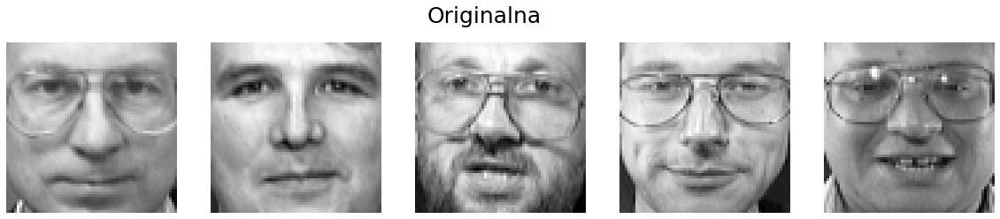

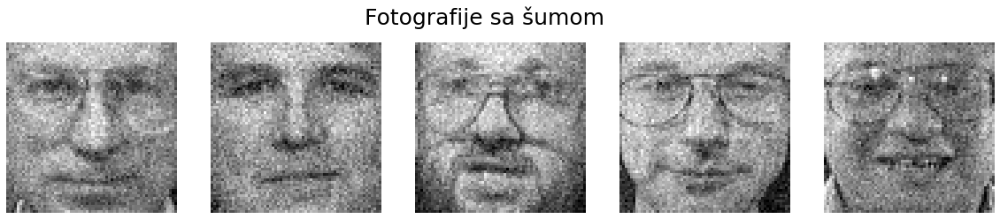

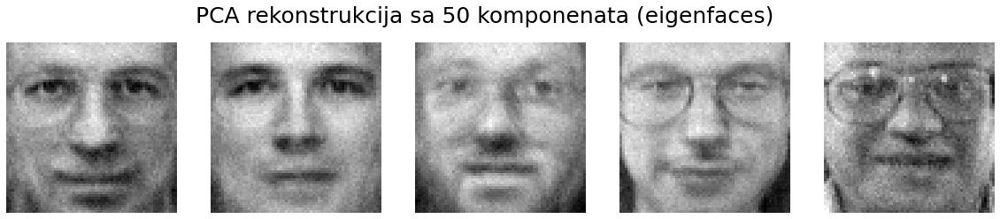

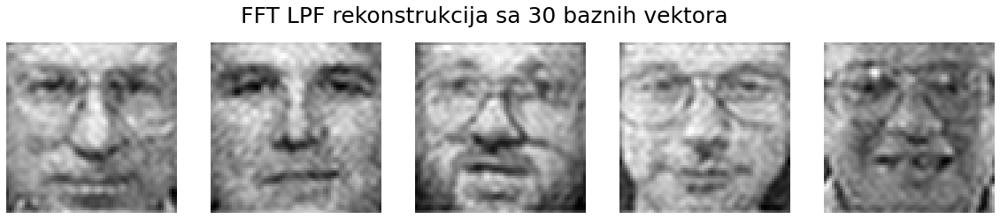

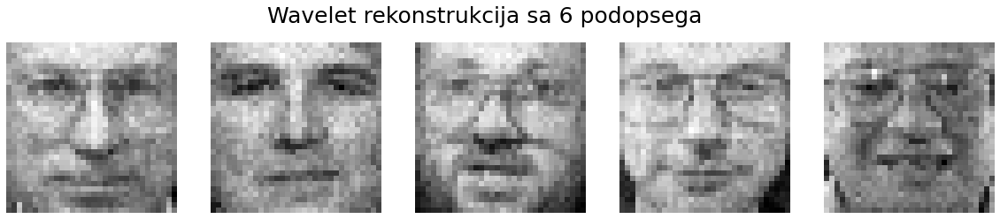

In [ ]:
import numpy as np
from numpy.random import RandomState
import matplotlib.pyplot as plt
from sklearn.datasets import fetch_olivetti_faces
from sklearn import decomposition
from skimage.util import random_noise
from skimage import img_as_float
from time import time
import scipy.fftpack as fp
import pywt

n_components = 50 # 256
image_shape = (64, 64)
rng = RandomState(0)

# 1. 
"""
Prvo preuzmite podatke (faces):
"""
dataset = fetch_olivetti_faces(shuffle=True, random_state=rng)
original = img_as_float(dataset.data)
faces = original.copy()
print(faces.shape)

# 2.
"""
Dodajte slučajni Gauss-ov šum na fotografiju sa odstupanjem od 0,005:
"""
#mean_face = faces.mean(axis=0)
#faces = faces - mean_face
n_samples, n_features = faces.shape
image_shape = (64, 64)
rng = RandomState(0)
faces = random_noise(faces, var=0.005)

# 3.
"""
Koristite PCA i rekonstruišite fotografije koristeći samo 50 dominantno glavnih
komponenti:
"""
n_components = 50 # 256
estimator = decomposition.PCA(n_components=n_components, svd_solver='randomized', whiten=True)
print("Extracting the top %d PCs..." % (n_components))
t0 = time()
faces_recons = estimator.inverse_transform(estimator.fit_transform(faces)) #.T #+ mean_face #.T
train_time = (time() - t0)
print("done in %0.3fs" % train_time)

# 4. 
"""
Nasumično odaberite pet indeksa fotografija i prikažite originalnu fotografiju, 
fotografiju šuma i PCA rekonstrukcije:

"""
indices = np.random.choice(n_samples, 5, replace=False)
plt.figure(figsize=(20,4))
for i in range(len(indices)):
    plt.subplot(1,5,i+1), plt.imshow(np.reshape(original[indices[i],:], image_shape)), plt.axis('off')
plt.suptitle('Originalna', size=25)
plt.show()

#faces = faces + mean_face
plt.figure(figsize=(20,4))
for i in range(len(indices)):
    plt.subplot(1,5,i+1), plt.imshow(np.reshape(faces[indices[i],:], image_shape)), plt.axis('off')
plt.suptitle('Fotografije sa šumom', size=25)
plt.show()

plt.figure(figsize=(20,4))
for i in range(len(indices)):
    plt.subplot(1,5,i+1), plt.imshow(np.reshape(faces_recons[indices[i],:], image_shape)), plt.axis('off')
plt.suptitle('PCA rekonstrukcija sa {} komponenata (eigenfaces)'.format(n_components), size=25)
plt.show()

# 5.
"""
Koristite FFT niskopropusni filter (LPF) odbacivanjem svih, osim trideset komponenata 
sa najnižim frekvencijama i rekonstruisati fotografiju šuma sa ovim osnovnim vektorima. 
Prikažite rekonstruisane fotografije:
"""
n_components = 30 
plt.figure(figsize=(20,4))
for i in range(len(indices)):
    freq = fp.fftshift(fp.fft2((np.reshape(faces[indices[i],:], image_shape)).astype(float)))
    freq[:freq.shape[0]//2 - n_components//2,:] = freq[freq.shape[0]//2 + n_components//2:,:] = 0
    freq[:, :freq.shape[1]//2 - n_components//2] = freq[:, freq.shape[1]//2 + n_components//2:] = 0
    plt.subplot(1,5,i+1), plt.imshow(fp.ifft2(fp.ifftshift(freq)).real), plt.axis('off')
plt.suptitle('FFT LPF rekonstrukcija sa {} baznih vektora'.format(n_components), size=25)
plt.show()

# 6.
"""
Koristite DWT i odbacite sedmi opseg da biste rekonstruisali fotografiju. 
Prikažite rekonstruisane fotografije:
"""
plt.figure(figsize=(20,4))
wavelet = pywt.Wavelet('haar')
for i in range(len(indices)):
    wavelet_coeffs = pywt.wavedec2((np.reshape(faces[indices[i],:], image_shape)).astype(float), wavelet)
    plt.subplot(1,5,i+1), plt.imshow(pywt.waverec2(wavelet_coeffs[:-1], wavelet)), plt.axis('off')
plt.suptitle('Wavelet rekonstrukcija sa {} podopsega'.format(len(wavelet_coeffs)-1), size=25)
plt.show()

### Gradient Blending // Mešanje gradijenta

Cilj uređivanja Poissonove fotografije je izvođenje bešavnog (gradijentnog) mešanja (kloniranja) objekta ili teksture sa izvorne slike (snimljene fotografijom maske) ​​sa ciljanom fotografijom. Želimo da napravimo fotomontažu lepljenjem regiona fotografije na novu pozadinu pomoću Poissonovog uređivanja fotografija. Ideja je nastala u radu SIGGRAPH 2003, Poisson Image Editing, koji pokazuje da mešanje pomoću gradijenata slike daje mnogo realnije rezultate.

Gradijent izvornih i izlaznih fotografija u maskiranom regionu biće isti nakon završetka neprimetnog kloniranja. Štaviše, intenzitet ciljne fotografije i izlazne fotografije na granici maskiranog regiona biće isti. Sledeći dijagram pokazuje kako je izvorna zakrpa fotografije g integrisana neprimetno sa ciljnom fotografijom f (preko regiona Ω), sa novim flasterom fotografije f (preko regiona Ω) dobijenog kao rešenje sa Poissonovim rešavačem:

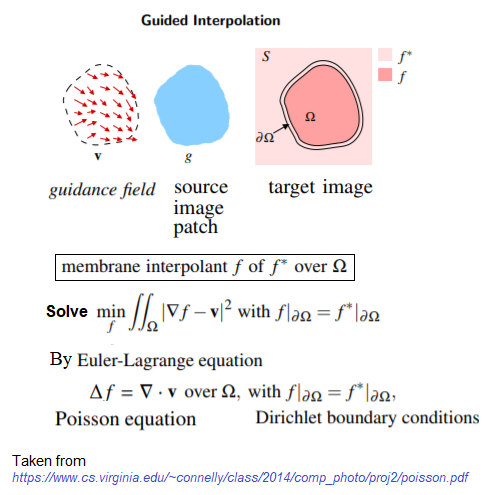

In [ ]:
import cv2
print(cv2.__version__) # make sure the major version of OpenCV is 3
# 3.4.2
import numpy as np
# 1. Učitavanje izvorne, fotografije destinacije i maske
src = cv2.imread("images/liberty.png")
dst = cv2.imread("images/victoria.png")
src_mask = cv2.imread("images/cmask.png")
print(src.shape, dst.shape, src_mask.shape)
# (480, 360, 3) (576, 768, 3) (480, 360, 3)
# 2. 
"""
Pokrenite glatko (bez vidljivog mesta spajanja) kloniranje da biste uklopili maskirani izvor oko centra u
odredišnu fotografiju i sačuvajte izlaznu fotografiju:
"""
center = (275,250) 
output = cv2.seamlessClone(src, dst, src_mask, center, cv2.MIXED_CLONE)
cv2.imwrite("images/liberty_victoria.png", output)
# pogledati rezultujuću fotografiju pod nazivom liberty_victoria.png u folderu images

4.1.2
(480, 360, 3) (576, 768, 3) (480, 360, 3)


True

### Improving Image Contrast with histogram equalization // Pobošljanje kontrasta fotografije pomoću izjednačavanja histograma





Operacija istezanja kontrasta, koja se može koristiti za povećanje kontrasta fotografije, je samo linearna funkcija skaliranja koja se primenjuje na vrednosti piksela fotografije, pa je stoga poboljšanje fotografije manje drastično od izjednačavanja histograma. 
Ovde ćemo primeniti istezanje kontrasta pomoću izjednačavanja histograma. To je takođe tačkasta transformacija koja koristi nelinearno mapiranje koje prekomerno dodeljuje vrednosti intenziteta piksela na ulaznoj fotografiji na takav način da izlazna fotografija ima jednoliku raspodelu intenziteta (ravni histogram), a time pojačava kontrast fotografija.

Za svaki kanal, vrednost svakog piksela mora biti dodeljena odgovarajućoj cdf vrednosti za piksel, kao što je prikazano na sledećem dijagramu:

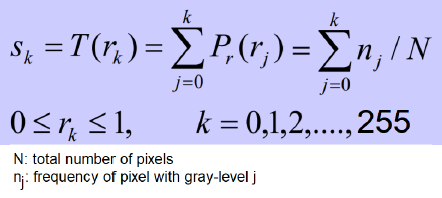

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: VisibleDeprecationWarning: Passing `normed=True` on non-uniform bins has always been broken, and computes neither the probability density function nor the probability mass function. The result is only correct if the bins are uniform, when density=True will produce the same result anyway. The argument will be removed in a future version of numpy.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: VisibleDeprecationWarning: Passing `normed=True` on non-uniform bins has always been broken, and computes neither the probability density function nor the probability mass function. The result is only correct if the bins are uniform, when density=True will produce the same result anyway. The argument will be removed in a future version of numpy.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: VisibleDeprecationWarning: Passing `normed=True` on non-uniform bins has always been broken, and computes nei

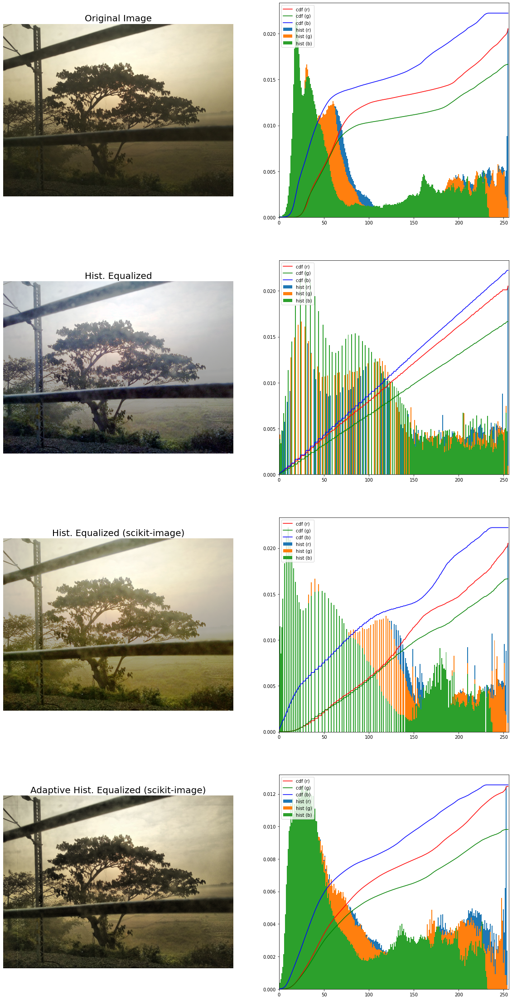

In [ ]:
import numpy as np
import matplotlib.pylab as plt
from skimage.io import imread
from skimage.exposure import equalize_hist, equalize_adapthist

# 1.
"""
Definišite funkcije plot_image() i plot_hist() za prikaz fotografije koje će
vrati njegovu kumulativnu funkciju distribucije (cdf), respektivno:
"""
def plot_image(image, title):
    plt.imshow(image)
    plt.title(title, size=20)
    plt.axis('off')
    
def plot_hist(img):
    colors = ['r', 'g', 'b']
    cdf = np.zeros((256,3))
    for i in range(3):
        hist, bins = np.histogram(img[...,i].flatten(),256,[0,256], normed=True)
        cdf[...,i] = hist.cumsum()
        cdf_normalized = cdf[...,i] * hist.max() / cdf.max()
        plt.plot(cdf_normalized, color = colors[i], label='cdf ({})'.format(colors[i]))
        #plt.hist(img[...,i].flatten(),256,[0,256], color = colors[i], density=True)
        binWidth = bins[1] - bins[0]
        plt.bar(bins[:-1], hist*binWidth, binWidth, label='hist ({})'.format(colors[i]))
        plt.xlim([0,256])
    plt.legend(loc = 'upper left')
    return cdf

# 2. 
"""
Sprovedite izjednačavanje histograma prekomponovanjem vrednosti piksela sa
odgovarajuće cdf vrednosti za taj piksel pomoću sledećeg koda:
"""
img = imread('images/train.png')
#print(np.max(img))

plt.figure(figsize=(20,40))
#plt.gray()

plt.subplot(421), plot_image(img, 'Original Image')
plt.subplot(422) 
cdf = plot_hist(img)

img2 = np.copy(img)
for i in range(3):
    cdf_m = np.ma.masked_equal(cdf[...,i],0)
    cdf_m = (cdf_m - cdf_m.min())*255/(cdf_m.max()-cdf_m.min())
    #cdf_m = 255 * cdf / cdf[-1] # normalize
    cdf2 = np.ma.filled(cdf_m,0).astype('uint8')
    img2[...,i] = cdf2[img[...,i]]

plt.subplot(423), plot_image(img2, 'Hist. Equalized')
plt.subplot(424), plot_hist(img2)

# 3.
"""
Izvršite izjednačavanje histograma sa istom ulaznom fotografijom 
koristeći scikit-image funkciju 
koja primenjuje globalno i adaptivno izjednačavanje histograma:
"""
equ = (255*equalize_hist(img)).astype(np.uint8)
plt.subplot(425), plot_image(equ, 'Hist. Equalized (scikit-image)')
plt.subplot(426), plot_hist(equ)


equ = (255*equalize_adapthist(img)).astype(np.uint8)
plt.subplot(427), plot_image(equ, 'Adaptive Hist. Equalized (scikit-image)')
plt.subplot(428), plot_hist(equ)

plt.savefig('images/hist_out.png', bbox_in='tight', pad_in=0)

plt.show()

### Image Denoising with Anisotropic Diffusion // Otklanjanje šuma pomoću anizotropne difuzije

Anizotropna difuzija je tehnika čiji je cilj smanjenje šuma slike bez uklanjanja značajnih delova sadržaja slike, obično ivica, linija ili drugih detalja koji su važni za interpretaciju fotografiju.
 
Prilikom otklanjanja šuma fotografije pomoću anizotropne difuzije, potrebno je koristiti jednačinu anizotropne (toplotne) difuzije za označavanje fotografije koja zadržava ivice pomoću funkcija biblioteke medpy. Izotropna difuzija je, sa druge strane, identična primeni Gausovog filtera, koji ne zadržava ivice na fotografiji.

Anizotropna difuzija je korišćena za zaglađivanje (odslikavanje) fotografije zadržavanjem ivica uglavnom nepromenjenim (čak i izoštrenim). U procesu anizotropne difuzije (koji je iterativni postupak), Gausovo jezgro se koristi kao funkcija provodljivosti (c), prema Perona-Malikovoj jednačini 1, kao što je prikazano na sledećem snimku ekrana:

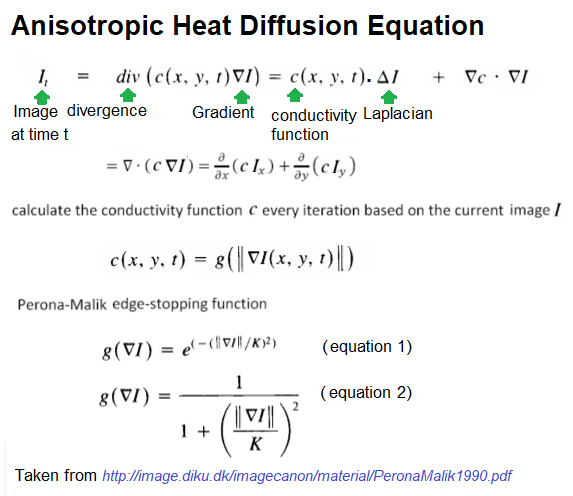

In [ ]:
!pip3 install medpy


     |████████████████████████████████| 153kB 7.6MB/s 
  Created wheel for medpy: filename=MedPy-0.4.0-cp37-cp37m-linux_x86_64.whl size=754459 sha256=11da696a09fbcc4640d95ca00998c9933c7bca59dba44fc2df560ab13c6b2a50
  Stored in directory: /root/.cache/pip/wheels/8c/c9/9c/2c6281c7a72b9fb1570862a4f028af7ce38405008354fbf870
Successfully built medpy


/usr/local/lib/python3.7/dist-packages/medpy/filter/smoothing.py:155: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  deltas[i][slicer] = numpy.diff(out, axis=i)
/usr/local/lib/python3.7/dist-packages/medpy/filter/smoothing.py:164: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  matrices[i][slicer] = numpy.diff(matrices[i], axis=i)


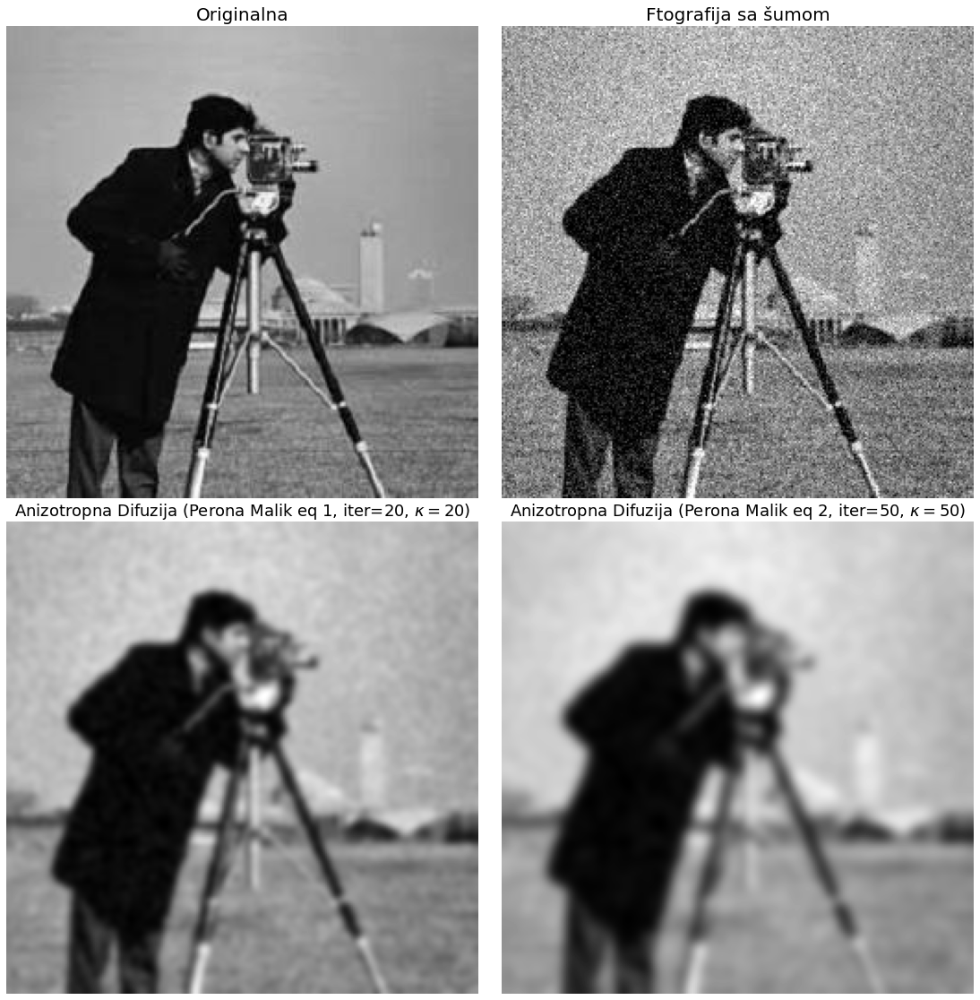

'\nIz prethodnog izlaza možete uvideti:\n-Kada se kappa vrednost i broj iteracija povećaju, fotografija postaje mutnija.\n'

In [ ]:
# Učitavanje potrebnih bilblioteka
from medpy.filter.smoothing import anisotropic_diffusion
from skimage.util import random_noise
import matplotlib.pylab as plt
from skimage.color import rgb2gray
from skimage.io import imread
import numpy as np

# 1. 
"""
Prvo učitajte grayscale fotografiju kamermana i dodajte slučajni Gaussian
šum (sa varijansom od 0,025) na nju. Isecite fotografiju šuma da biste imali vrednosti
strogo između 0 i 1 (uključujući granične vrednosti):
"""
img = rgb2gray(imread('images/cameraman.png'))
noisy = random_noise(img, var=0.01)
noisy = np.clip(noisy, 0, 1)

# 2.
"""
Prikažite originalnu i fotografiju sa šumom
"""
plt.figure(figsize=(15,15))
plt.gray()
plt.subplots_adjust(0,0,1,1,0.05,0.05)
plt.subplot(221), plt.imshow(img), plt.axis('off'), plt.title('Originalna', size=20)
plt.subplot(222), plt.imshow(noisy), plt.axis('off'), plt.title('Ftografija sa šumom', size=20)

# 3.
"""
Primeniti anizotropnu difuziju (prema Perona-Malikovoj jednačini 1) sa
parametrima kappa = 20 i niter = 20 za označavanje fotografije šuma. 
Prikažite zaglađenu(smoothed) fotografiju:
"""
diff_out = anisotropic_diffusion(noisy, niter=20, kappa=20, option=1)
plt.subplot(223), plt.imshow(diff_out), plt.axis('off'), plt.title(r'Anizotropna Difuzija (Perona Malik eq 1, iter=20, $\kappa=20$)', size=18)

# 4.
"""
Primeniti anizotropnu difuziju (prema Perona-Malikovoj jednačini 2) sa
parametrima kappa = 50 i niter = 50 za označavanje fotografije šuma. 
Prikažite zaglađenu(smoothed) fotografiju:
"""
diff_out = anisotropic_diffusion(noisy, niter=50, kappa=100, option=2)
plt.subplot(224), plt.imshow(diff_out), plt.axis('off'), plt.title(r'Anizotropna Difuzija (Perona Malik eq 2, iter=50, $\kappa=50$)', size=18)
plt.show()

"""
Iz prethodnog izlaza možete uvideti:
-Kada se kappa vrednost i broj iteracija povećaju, fotografija postaje mutnija.
"""

## Dodatni primeri

### Edge Detection with Anisotropic Diffusion // Detekcija ivica pomoću anizotropne difuzije

Instalacija medpy modula

In [ ]:
!pip3 install medpy


/usr/local/lib/python3.7/dist-packages/medpy/filter/smoothing.py:155: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  deltas[i][slicer] = numpy.diff(out, axis=i)
/usr/local/lib/python3.7/dist-packages/medpy/filter/smoothing.py:164: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  matrices[i][slicer] = numpy.diff(matrices[i], axis=i)


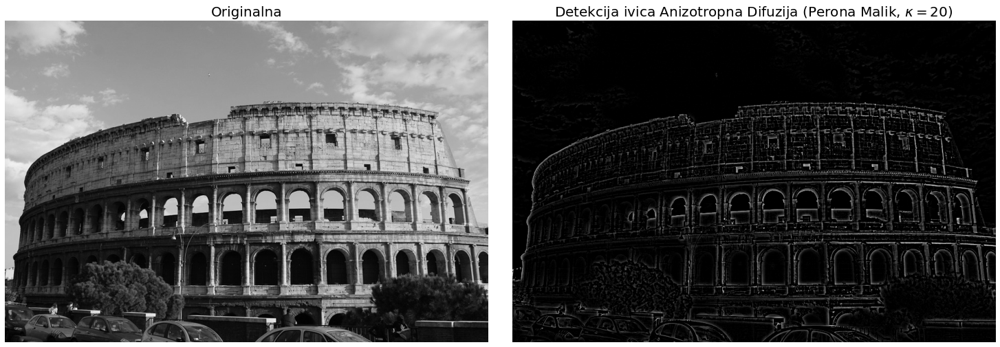

In [ ]:
from medpy.filter.smoothing import anisotropic_diffusion
from skimage.util import random_noise
import matplotlib.pylab as plt
from skimage.color import rgb2gray
from skimage.io import imread
import numpy as np

img = rgb2gray(imread('images/colosseum.png'))
plt.figure(figsize=(20,10))
plt.gray()
plt.subplots_adjust(0,0,1,1,0.05,0.05)
plt.subplot(121), plt.imshow(img), plt.axis('off'), plt.title('Originalna', size=20)
diff_out = anisotropic_diffusion(img, niter=50, kappa=20, option=1)
plt.subplot(122), plt.imshow(np.clip(diff_out-img,0,1)), plt.axis('off')
plt.title(r'Detekcija ivica Anizotropna Difuzija (Perona Malik, $\kappa=20$)', size=20)
plt.show()

## Korisni linkovi

* [PeronaMalik1990](http://image.diku.dk/imagecanon/material/PeronaMalik1990.pdf)
* [Variational Image Processing](https://sandipanweb.wordpress.com/2017/10/08/some-more-variational-image-processing-diffusiontv-denoising-image-inpainting/)
* [The Wavelet object](https://pywavelets.readthedocs.io/en/latest/regression/wavelet.html)



## Reference


1.   [Python Image Processing Cookbook](https://www.amazon.com/Python-Image-Processing-Cookbook-processing-ebook/dp/B084ZN7Y5F), Sandipan Dey

2.   [Computer Vision – Image Transform](https://www.scilab.org/tutorials/computer-vision-%E2%80%93-image-transform)

3.   [Basic concepts of the homography explained with code](https://docs.opencv.org/master/d9/dab/tutorial_homography.html)

## TO DO

**Zadatak 1**

Potrebno je učitati izvornu fotografiju i šablonsku fotografiju po želji, zatim ih spojiti kao na datom primeru.
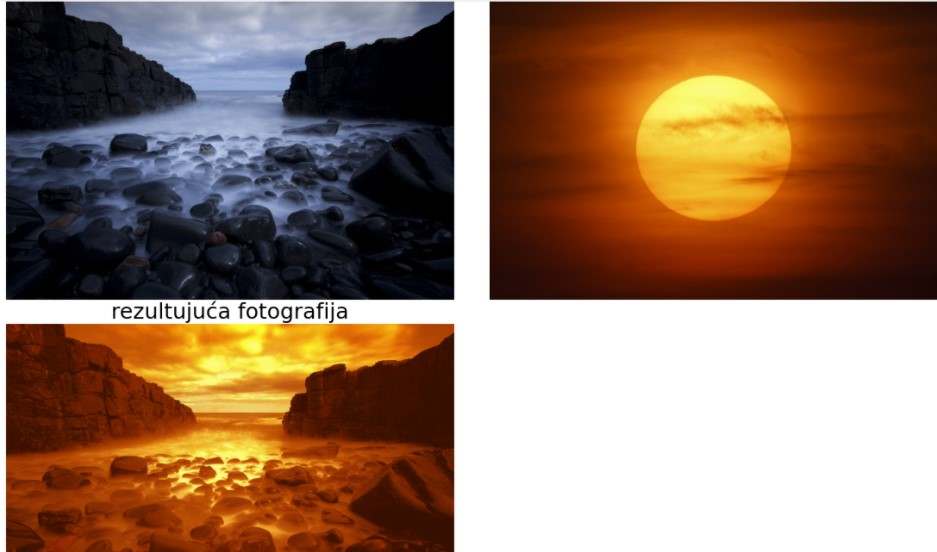




In [ ]:
# TO DO ... - uraditi zadatak

**Zadatak 2.**

Učitati fotografiju po izboru i izvršiti detektovanje ivica pomoću **Canny i LOG / Zero-Crossing**   (tehnika detekcija)

In [ ]:
# TO DO ... - uraditi zadatak